<a href="https://colab.research.google.com/github/halldm2000/NOAA-AI-2020-TUTORIAL/blob/master/curve_fitting_sea_ice_train_only.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Curve Fitting with PyTorch


In [ ]:
# Download sea-ice extent data

source = "ftp://sidads.colorado.edu/DATASETS/NOAA/G02135/north/daily/data/N_seaice_extent_daily_v3.0.csv"
dest    = "/content/data/"
!wget  -c -e robots=off -P {dest} {source}

--2020-10-20 15:39:32--  ftp://sidads.colorado.edu/DATASETS/NOAA/G02135/north/daily/data/N_seaice_extent_daily_v3.0.csv
           => ‘/content/data/N_seaice_extent_daily_v3.0.csv’
Resolving sidads.colorado.edu (sidads.colorado.edu)... 128.138.135.20
Connecting to sidads.colorado.edu (sidads.colorado.edu)|128.138.135.20|:21... connected.
Logging in as anonymous ... Logged in!
==> SYST ... done.    ==> PWD ... done.
==> TYPE I ... done.  ==> CWD (1) /DATASETS/NOAA/G02135/north/daily/data ... done.
==> SIZE N_seaice_extent_daily_v3.0.csv ... 1556166
File has already been retrieved.
2020-10-20 15:39:32 (0.00 B/s) - ‘/content/data/N_seaice_extent_daily_v3.0.csv’ saved [1556166]



In [ ]:
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler

!mkdir -p images

xscaler = StandardScaler()
yscaler = StandardScaler()

def load_data():

    import numpy as np
    from datetime import datetime, timedelta
    sec_per_day = 3600*24

    csv    = "/content/data/N_seaice_extent_daily_v3.0.csv"
    data   = np.loadtxt(csv, skiprows=2, delimiter=',', usecols=(0,1,2,3,4))
    extent = data[:,3]
    nrows  = data.shape[0]

    yday   = np.zeros_like(extent)
    time   = np.zeros_like(extent)
    start  = datetime(1978,1,1)

    for i in range(nrows):
      yr, month, day = data[i,0:3].astype(int)
      date = datetime(yr,month,day)
      yday[i] = date.timetuple().tm_yday
      time[i] = (date-start).total_seconds()/sec_per_day

    x = np.reshape(yday,  (-1,1))
    y = np.reshape(extent,(-1,1))
    t = np.reshape(time,  (-1,1))

    x = torch.from_numpy(xscaler.fit_transform(x))
    y = torch.from_numpy(yscaler.fit_transform(y))

    return x,y,t 



In [ ]:
def plot():

  global X,Y, Xpred, xpred

  if(epoch%200!=0): return

  # initialize some plotting varibles
  if(epoch==0): 
    plot.frame =0
    X = xscaler.inverse_transform(x)
    Y = yscaler.inverse_transform(y)
    Xpred = np.reshape(np.linspace(0,365,366),(-1,1))
    xpred = xscaler.transform(Xpred)

  # plot training examples
  plt.figure(figsize=(10,7.5),dpi=72*1.25)
  plt.scatter(X,Y,c=t,alpha=0.2, s=5)
  plt.ylim(Y.min(), Y.max())
  plt.xlabel("day of the year", fontsize=12)
  plt.ylabel("million sq km ", fontsize=12);
  plt.title(f"Annual Artic Sea-ice Extent. epoch={epoch} \n",fontsize=14)

  # print curve-fit equation
  terms = [f"${w[i]:+.1f} X^{i} $" for i in range(len(w))]
  eqn   = "y ="+ ''.join(terms)+ f"     $X = x - {x0[0]:.2f}$"
  plt.text(0.5, 1.02, eqn, transform=plt.gca().transAxes, fontsize=10, horizontalalignment='center')
  
  # plot curve-fit
  ypred = model(torch.from_numpy(xpred))
  Ypred = yscaler.inverse_transform(ypred)
  plt.plot(Xpred,Ypred,'-',color='black', linewidth=3);
  
  # save figure to file
  plt.savefig(f'./images/img_{plot.frame:04d}',bbox_inches='tight');
  plot.frame+=1
  plt.show()

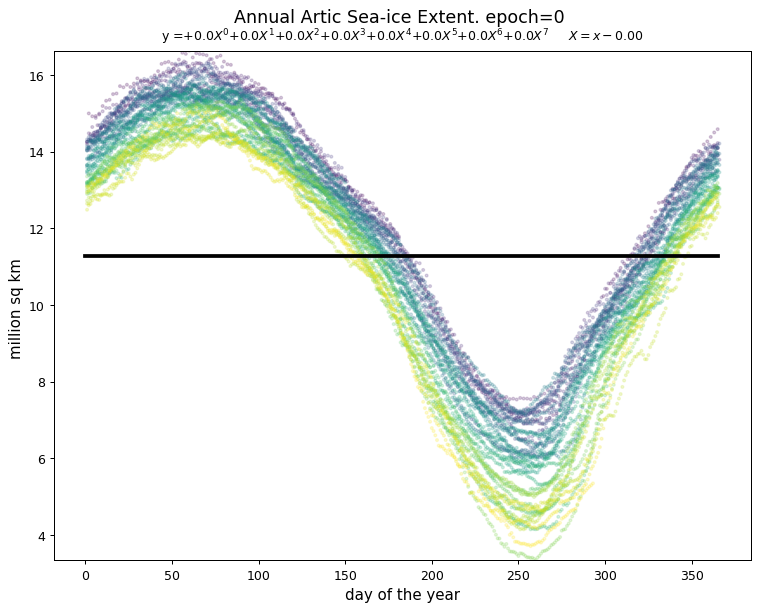

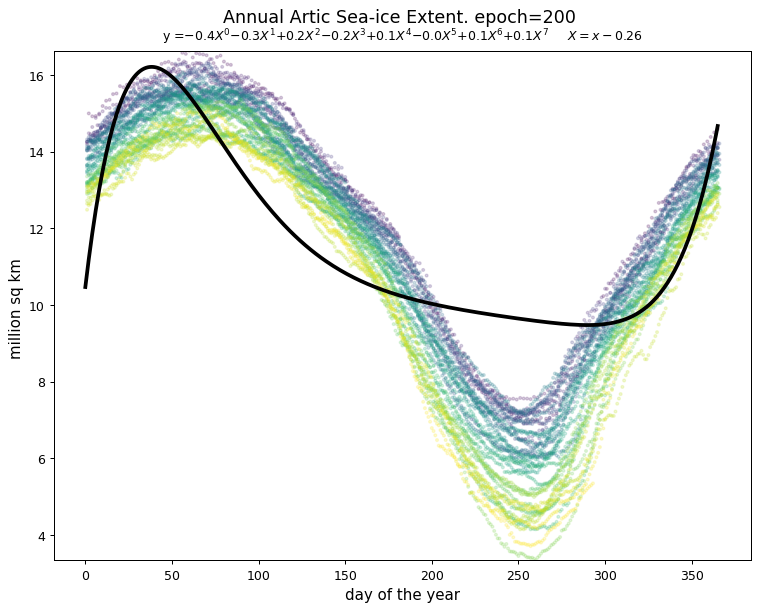

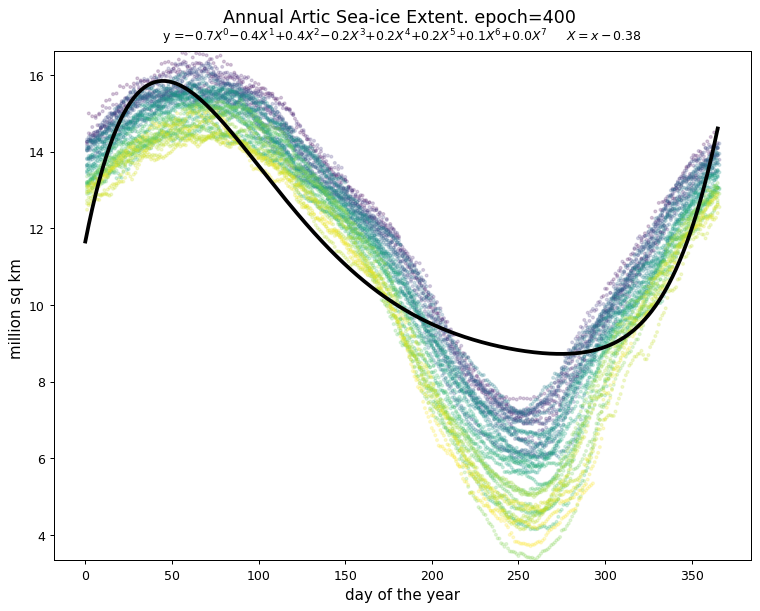

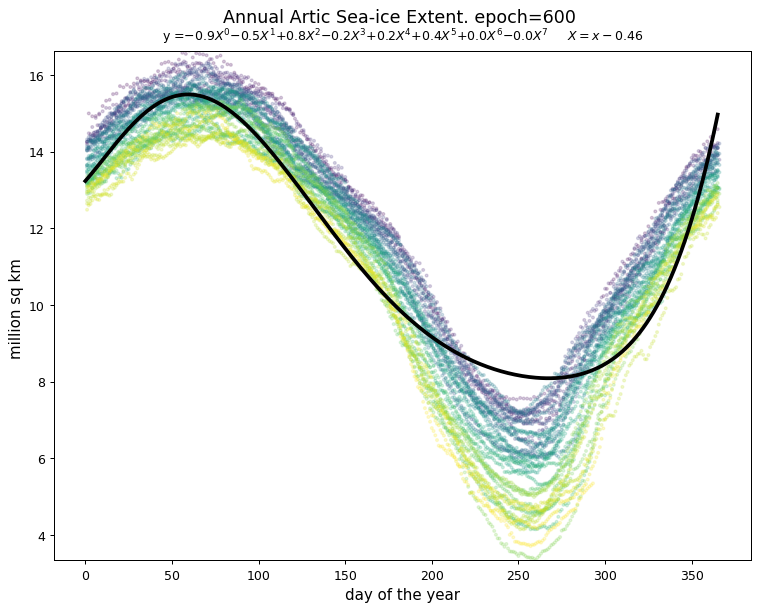

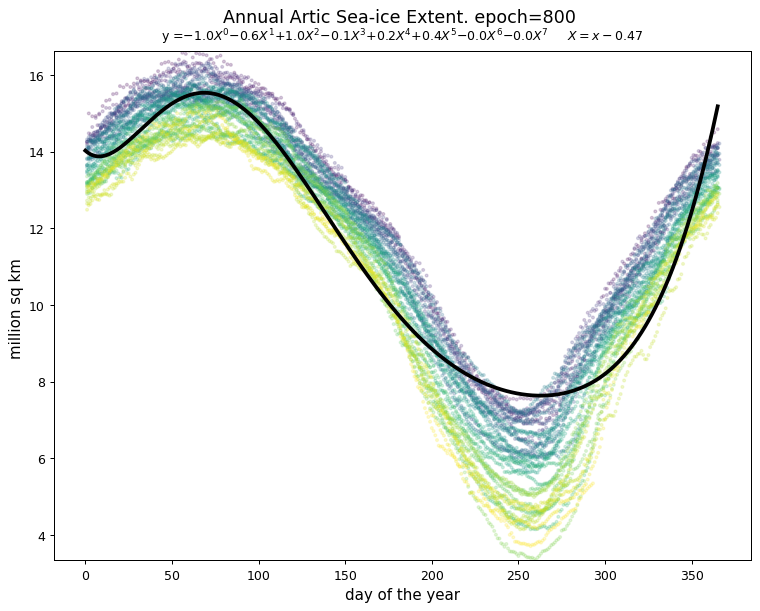

...

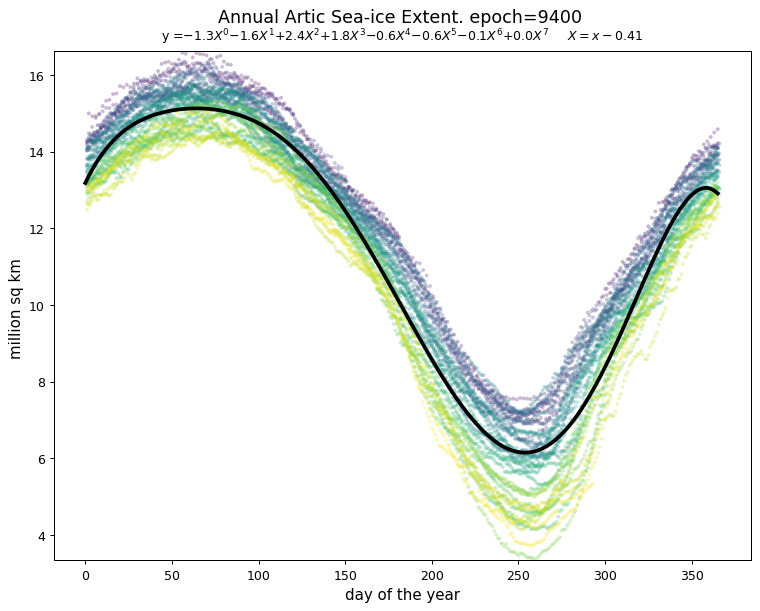

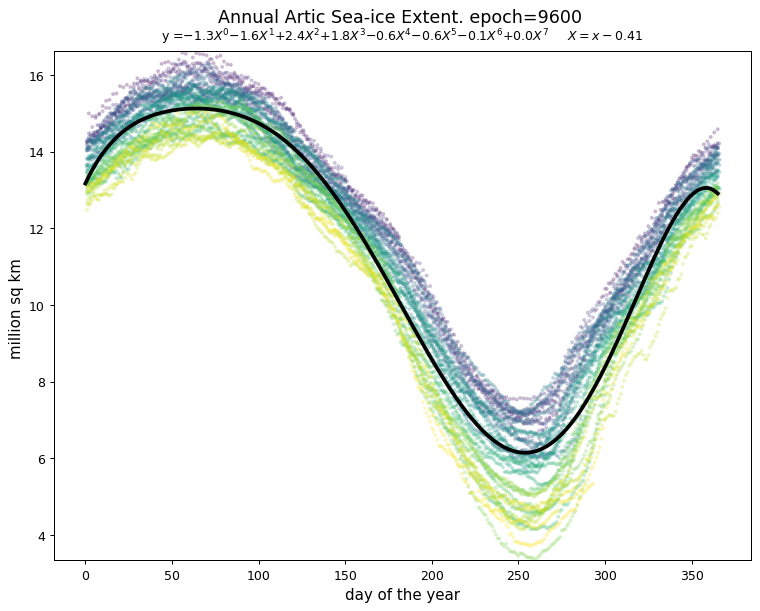

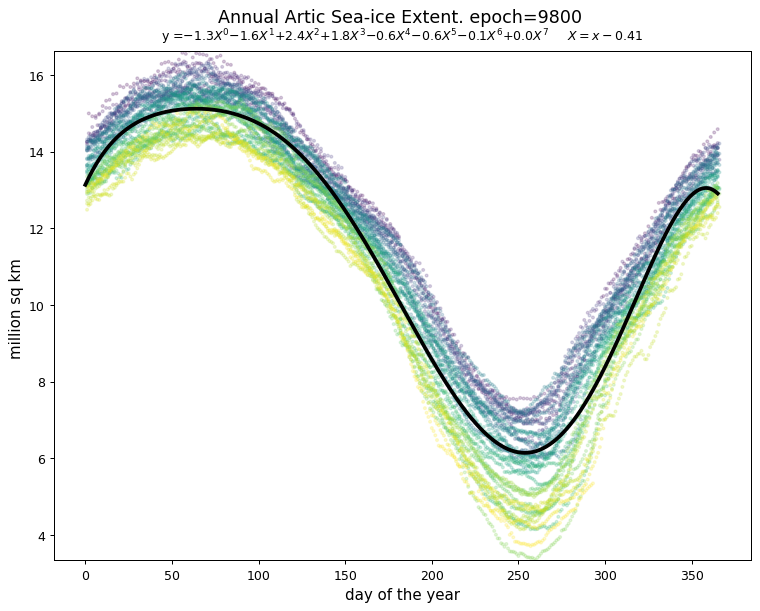

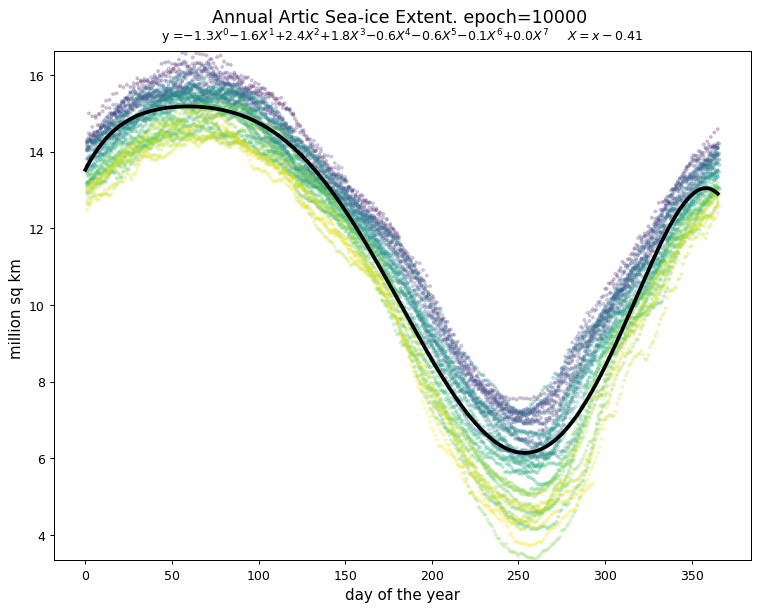

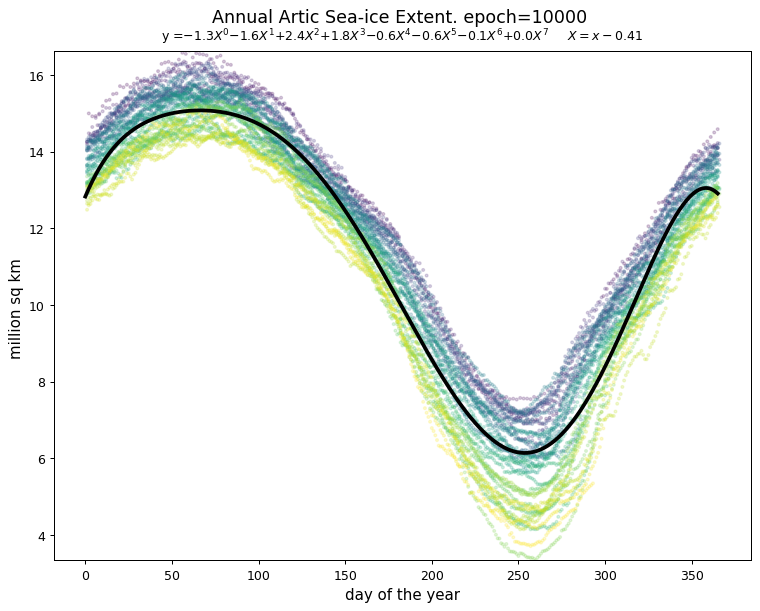

In [ ]:
import torch, numpy as np
torch.manual_seed(0)

# DATA
x,y,t = load_data()

# MODEL
N  = 7
x0 = torch.zeros(1,   requires_grad=True)
w  = torch.zeros(N+1, requires_grad=True)
def model(x): return sum( w[i]*(x-x0)**i for i in range(N+1) ) 

# CONFIGURE
optimizer = torch.optim.AdamW(params = [x0,w], lr=2e-3)
loss_fcn  = torch.nn.MSELoss()

for epoch in range(10001):

  with torch.no_grad(): plot()

  # TRAIN
  prediction = model(x)
  optimizer.zero_grad()
  loss = loss_fcn(prediction, y)
  loss.backward()
  optimizer.step()

with torch.no_grad(): plot()

In [ ]:
!ffmpeg -loglevel warning -i ./images/img_%04d.png -vf scale=1280:-2 -pix_fmt yuv420p -y out.mp4

In [ ]:
from IPython.display import HTML
from base64 import b64encode
mp4 = open('out.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

HTML("""
<video width=800 controls><source src="%s" type="video/mp4"></video>
""" % data_url)

In [ ]:
!rm ./images/img_*.png